In [1]:
%load_ext autoreload
%autoreload 2

In [1]:
from SlideRunner_dataAccess.database import Database
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import openslide
import pandas as pd
import pyvips
import os
import re

In [2]:
# set directories
root = Path.home() 
data_dir = Path('/data/department/aubreville/datasets/TMAs')
proj_dir = root / 'projects/Cox_AMIL'
database = root / 'projects/Cox_AMIL/tma_databases/Ostercappeln_HE.sqlite'

## Load and filter database

In [3]:
DB = Database().open(str(database))

# join annoId with classes 
get_cores = 'SELECT Classes.uid, Classes.name, Annotations_label.annoId FROM Classes LEFT JOIN Annotations_label ON Classes.uid=Annotations_label.class'
cores = pd.DataFrame(DB.execute(get_cores).fetchall(), columns=['core_id', 'core_label', 'anno_id'])

# get coordinates
get_coords = 'SELECT annoId, coordinateX, coordinateY, Annotations_coordinates.slide FROM Annotations_coordinates LEFT JOIN Annotations ON Annotations_coordinates.annoId=Annotations.uid WHERE Annotations.deleted=0'
coords = pd.DataFrame(DB.execute(get_coords), columns=['anno_id', 'x', 'y', 'slide_id'])

# join cores and coords
df = pd.merge(cores, coords, how='inner', on='anno_id')

# get slides
get_slides = 'SELECT uid, filename, directory FROM Slides'
slides = pd.DataFrame(DB.execute(get_slides), columns=['slide_id', 'filename', 'dir'])

# ============================================ #
#TODO: Change location and filenames to remove these manual steps!!!
# change directories
dirs = [str(data_dir)] * 3 + [os.path.join(data_dir, 'Delivery2')] * 5
slides = slides.assign(dir=dirs)

# add level 
level = [1] * 3 + [0] * 5
slides = slides.assign(level=level)

# add patient_id
patient_ids = [int(re.split('P|_', s)[1]) for s in df.core_label]
df = df.assign(patient_id=patient_ids)
# ============================================ #

In [4]:
df.head()

,core_id,core_label,anno_id,x,y,slide_id,patient_id
0,1,P1_1,1946.0,187569,202466,5,1
1,1,P1_1,1946.0,187573,202462,5,1
2,1,P1_1,1946.0,187593,202462,5,1
3,1,P1_1,1946.0,187597,202466,5,1
4,1,P1_1,1946.0,187601,202466,5,1


In [5]:
slides

,slide_id,filename,dir,level
0,1,DigitalSlide_A1M_1S_1.mrxs,/data/department/aubreville/datasets/TMAs,1
1,2,DigitalSlide_A1M_3S_1.mrxs,/data/department/aubreville/datasets/TMAs,1
2,3,DigitalSlide_A1M_9S_1.mrxs,/data/department/aubreville/datasets/TMAs,1
3,4,DigitalSlide_A1M_12S_1.mrxs,/data/department/aubreville/datasets/TMAs/Deli...,0
4,5,DigitalSlide_A1M_4S_1.mrxs,/data/department/aubreville/datasets/TMAs/Deli...,0
5,6,DigitalSlide_A1M_13S_1.mrxs,/data/department/aubreville/datasets/TMAs/Deli...,0
6,7,DigitalSlide_A1M_11S_1.mrxs,/data/department/aubreville/datasets/TMAs/Deli...,0
7,8,DigitalSlide_A1M_5S_1.mrxs,/data/department/aubreville/datasets/TMAs/Deli...,0


## A few sanity checks


In [6]:
import sys
sys.path.append('..')

from tma_utils.tma_utils import check_coreID_range, check_patientID_range

In [7]:
check_patientID_range(slide_id=1, low=151, high=303, df=df)

slide_id 1: True


In [8]:
check_patientID_range(slide_id=2, low=1, high=150, df=df)

slide_id 2: True


In [9]:
check_patientID_range(slide_id=3, low=304, high=394, df=df)

slide_id 3: True


In [10]:
check_patientID_range(slide_id=4, low=1, high=150, df=df)

slide_id 4: True


In [11]:
check_patientID_range(slide_id=5, low=1, high=150, df=df)

slide_id 5: True


In [12]:
check_patientID_range(slide_id=6, low=151, high=303, df=df)

slide_id 6: True


In [13]:
check_patientID_range(slide_id=7, low=304, high=394, df=df)

slide_id 7: True


In [14]:
check_patientID_range(slide_id=8, low=304, high=394, df=df)

slide_id 8: True


In [15]:
MIN = 1500
MAX = 6000
for slide_id in df.slide_id.unique():
    x_range, y_range, too_big, too_small = check_coreID_range(slide_id=slide_id, df=df, min=MIN, max=MAX, verbose=True)
    print('\nSlide {}: median x {}, median y {}\n'.format(slide_id, np.median(x_range), np.median(y_range)))
    print('='*50)
    


Slide 5 without suspicously large core annotations.

Slide 5 with 3 suspicously small core annotations.
Core 328, x_range 1406, y_range 2338
Core 341, x_range 1253, y_range 2505
Core 400, x_range 2303, y_range 1461

Slide 5: median x 2662.0, median y 2722.0


Slide 2 without suspicously large core annotations.

Slide 2 with 4 suspicously small core annotations.
Core 99, x_range 1067, y_range 2775
Core 106, x_range 1351, y_range 2007
Core 203, x_range 1655, y_range 1469
Core 344, x_range 1382, y_range 3546

Slide 2: median x 5084.0, median y 5080.5


Slide 4 without suspicously large core annotations.

Slide 4 with 2 suspicously small core annotations.
Core 7, x_range 784, y_range 1332
Core 157, x_range 1265, y_range 2090

Slide 4: median x 2622.5, median y 2584.0


Slide 1 without suspicously large core annotations.

Slide 1 without suspicously small core annotations.

Slide 1: median x 4948.0, median y 5066.0


Slide 6 without suspicously large core annotations.

Slide 6 without susp

### Visualize suspicous cases 

In [16]:
from tma_utils.tma_utils import extract_core

def show_core(slide: openslide.OpenSlide, 
              df: pd.DataFrame, 
              level: int=0,
              core_id:int=None, 
              core_name: str=None, 
              figsize: tuple=(10, 10)) -> None:

    core = extract_core(slide, df, level, core_id, core_name)
    
    if core is not None:
        plt.figure(figsize=figsize)
        plt.imshow(core)
        plt.show()
    else:
        pass

Slide 5, core 328, width 1406, height 2338


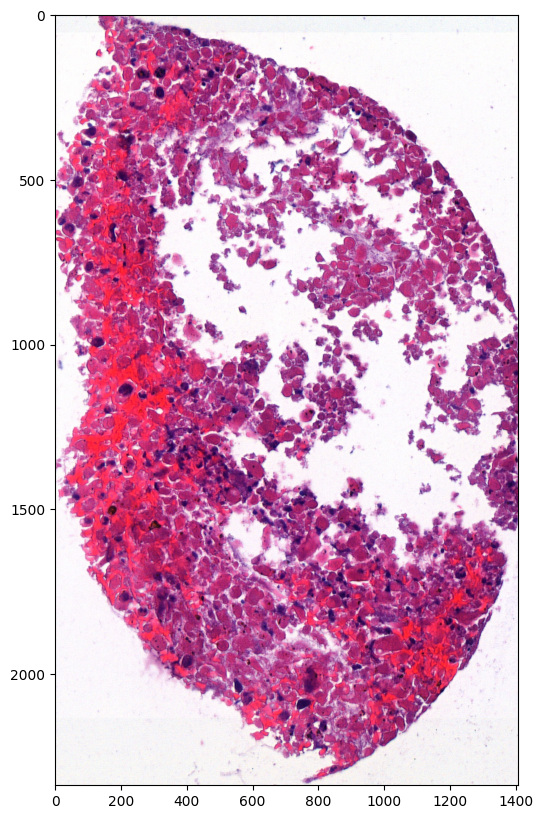

Slide 5, core 341, width 1253, height 2505


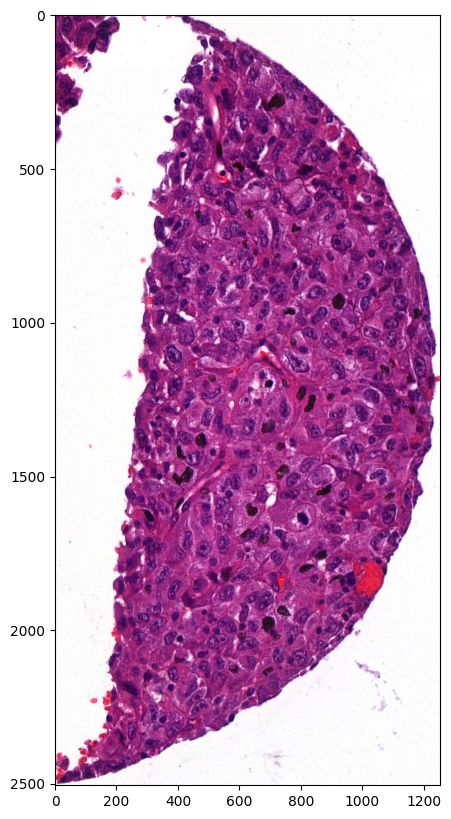

Slide 5, core 400, width 2303, height 1461


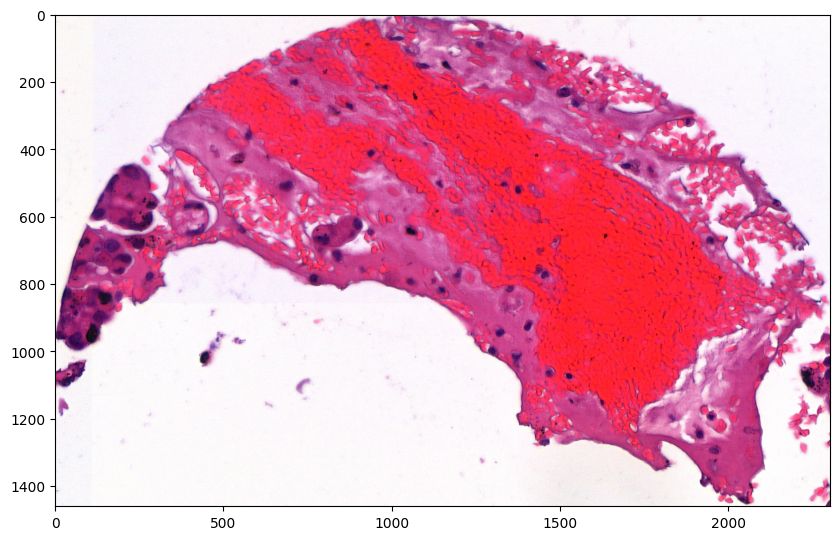

Slide 2, core 99, width 1067, height 2775


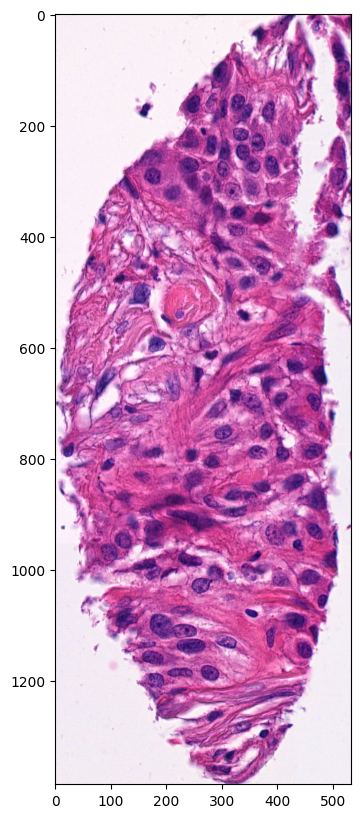

Slide 2, core 106, width 1351, height 2007


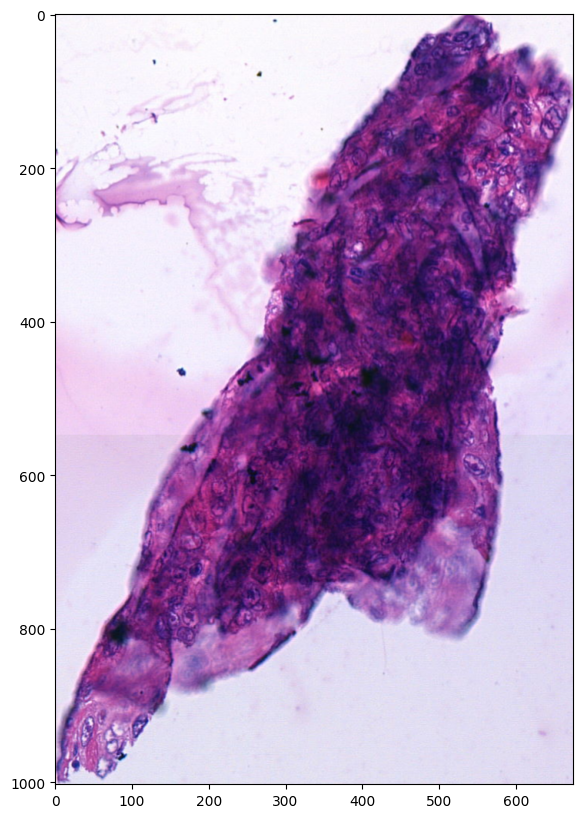

Slide 2, core 203, width 1655, height 1469


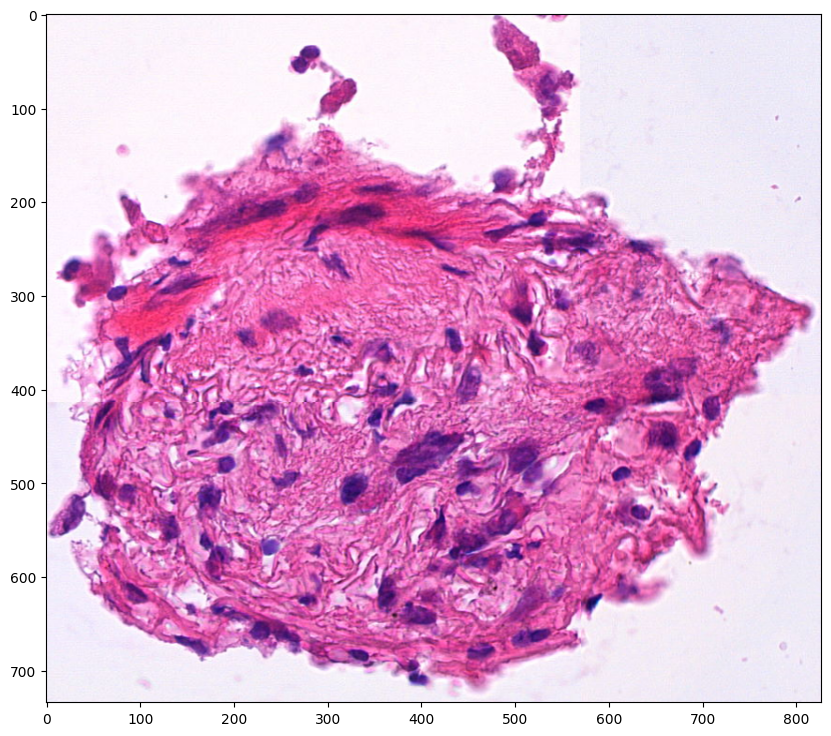

Slide 2, core 344, width 1382, height 3546


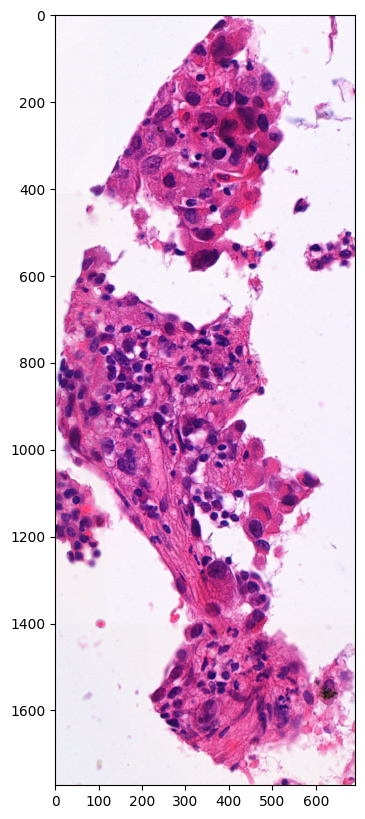

Slide 4, core 7, width 784, height 1332


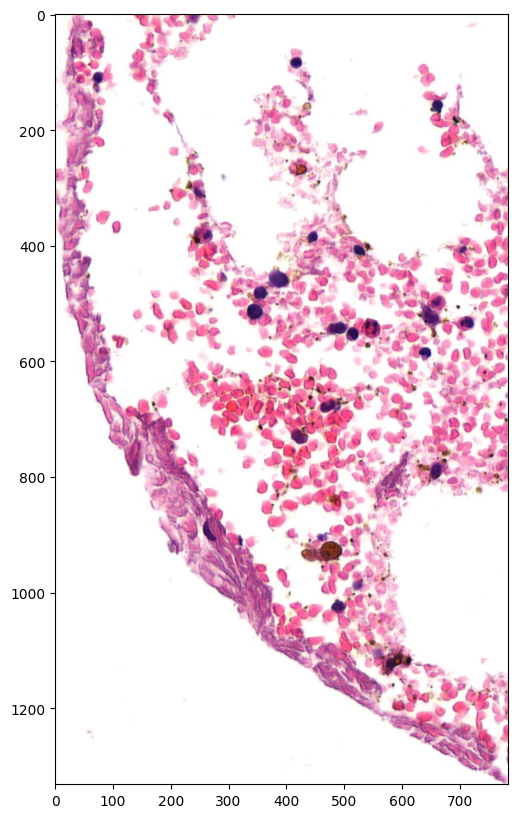

Slide 4, core 157, width 1265, height 2090


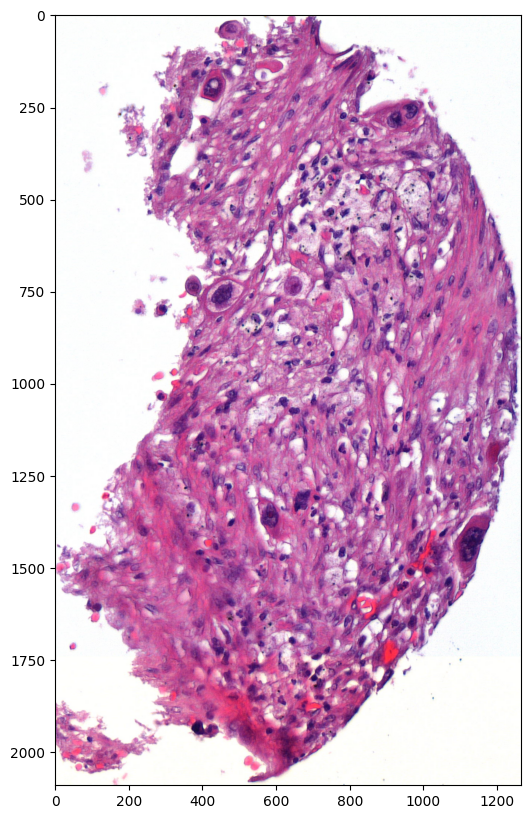

Slide 3, core 931, width 5427, height 6165


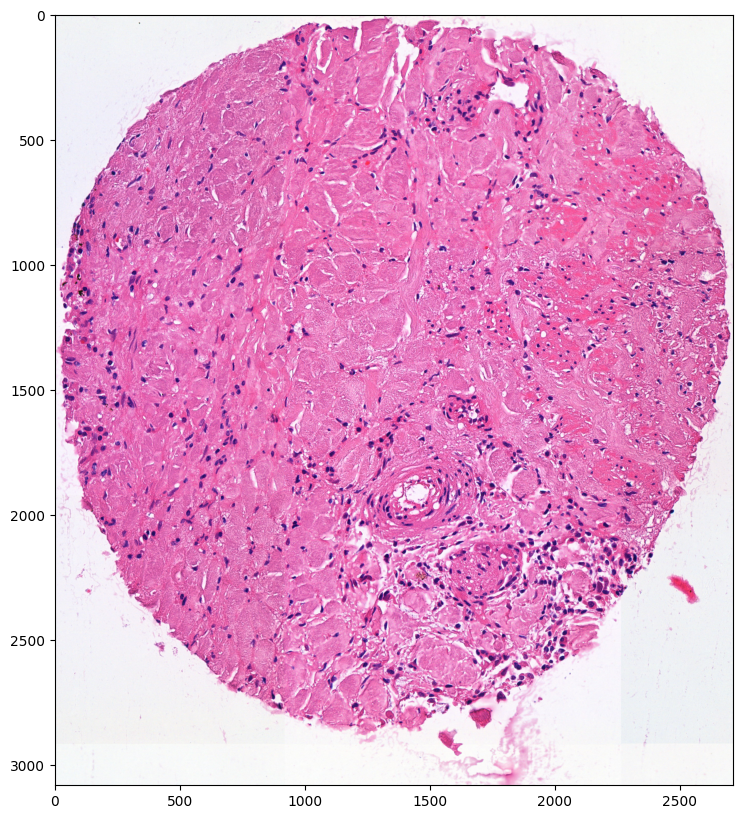

Slide 3, core 1059, width 5082, height 6212


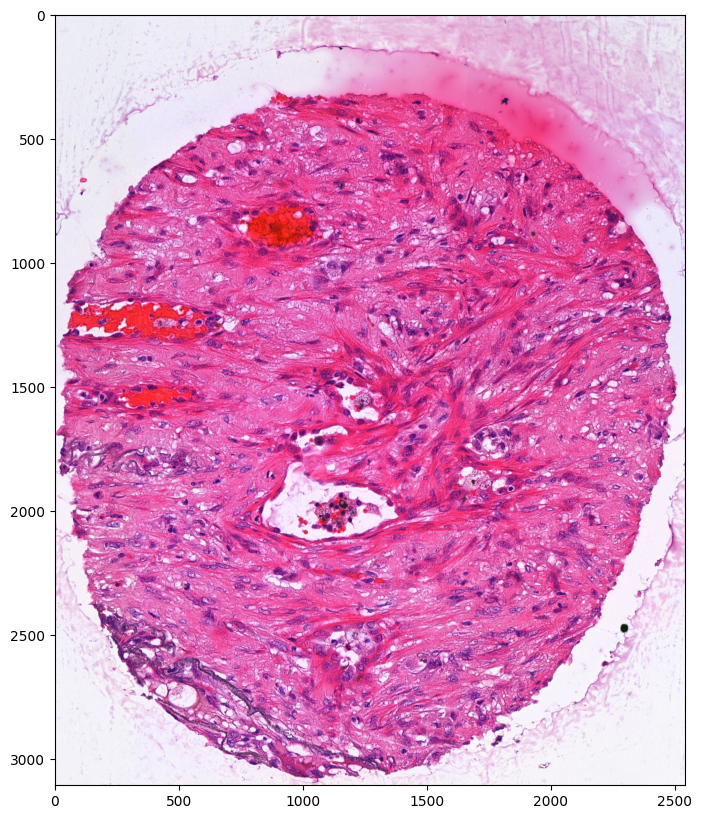

Slide 3, core 901, width 3098, height 1129


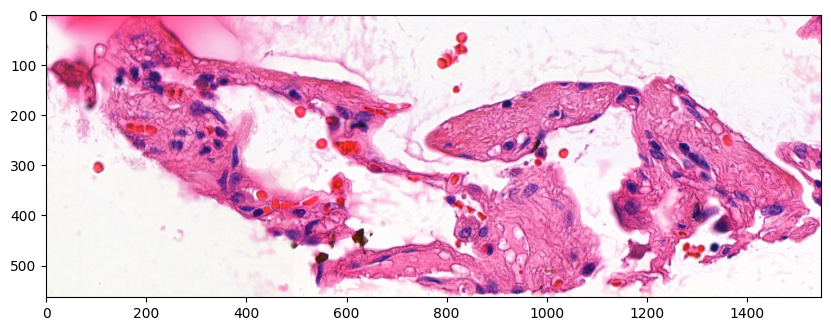

Slide 3, core 1072, width 3059, height 1436


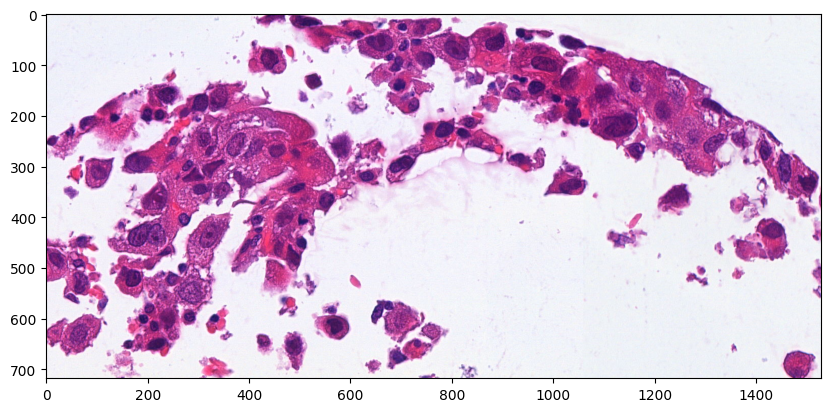

Slide 3, core 1120, width 1114, height 2220


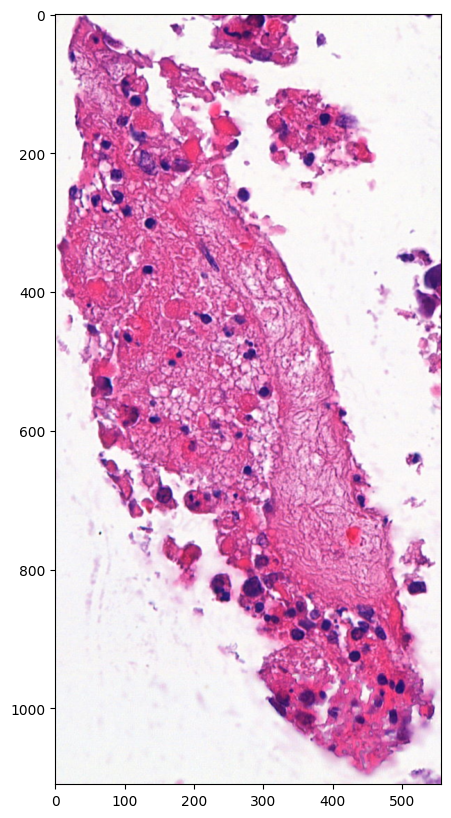

Slide 7, core 879, width 1337, height 2049


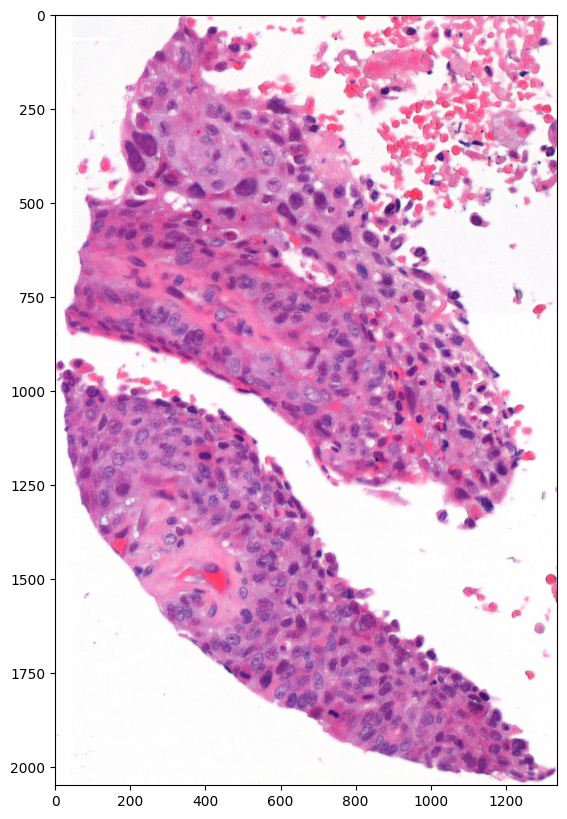

In [17]:
for slide_id in df.slide_id.unique():
    x_range, y_range, too_big, too_small = check_coreID_range(slide_id=slide_id, df=df, min=MIN, max=MAX)
    
    slide_fn = slides.dir[slides.slide_id == slide_id].item() + '/' + slides.filename[slides.slide_id == slide_id].item()
    slide_level = slides.level[slides.slide_id == slide_id].item()
    slide_df = df.loc[df.slide_id == slide_id]

    slide = openslide.open_slide(str(slide_fn))

    if len(too_big) > 0:
        for core_id, x_range, y_range in too_big:
            print('Slide {}, core {}, width {}, height {}'.format(slide_id, core_id, x_range, y_range))
            show_core(slide, slide_df, core_id=core_id, level=slide_level)

    if len(too_small) > 0:
        for core_id, x_range, y_range in too_small:
            print('Slide {}, core {}, width {}, height {}'.format(slide_id, core_id, x_range, y_range))
            show_core(slide, slide_df, core_id=core_id, level=slide_level)


## Visualize some normal cases

In [18]:
# select slide
slide_id = 3
slide_fn = data_dir / slides.filename.loc[slides.slide_id == slide_id].item()
slide_df = df.loc[df.slide_id == slide_id]
slide = openslide.open_slide(str(slide_fn))

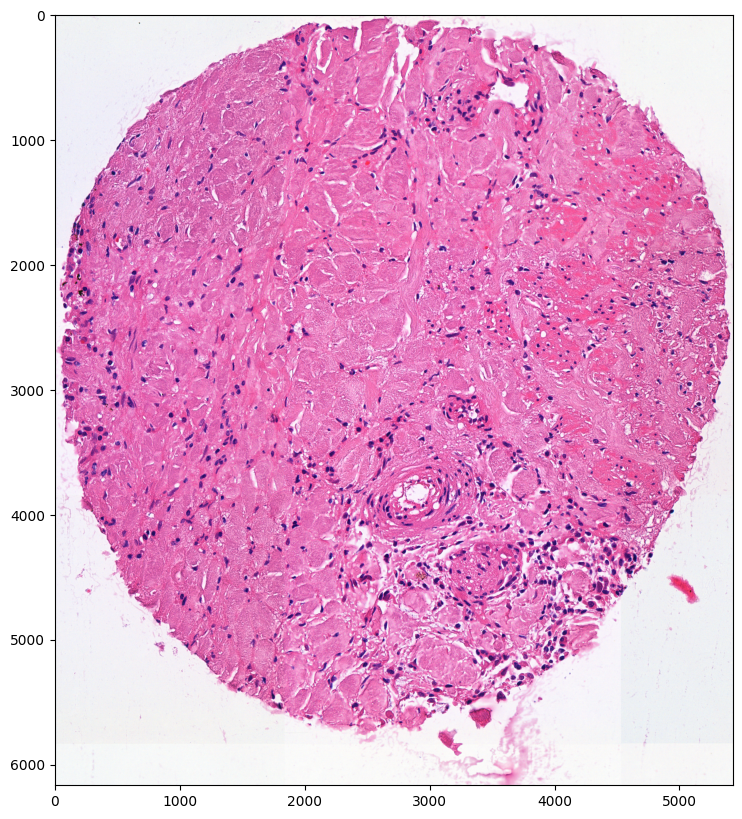

In [19]:
# select single core
show_core(slide, slide_df, core_name='P326_1')

In [ ]:
show_core(slide, slide_df, core_name='P347_1')

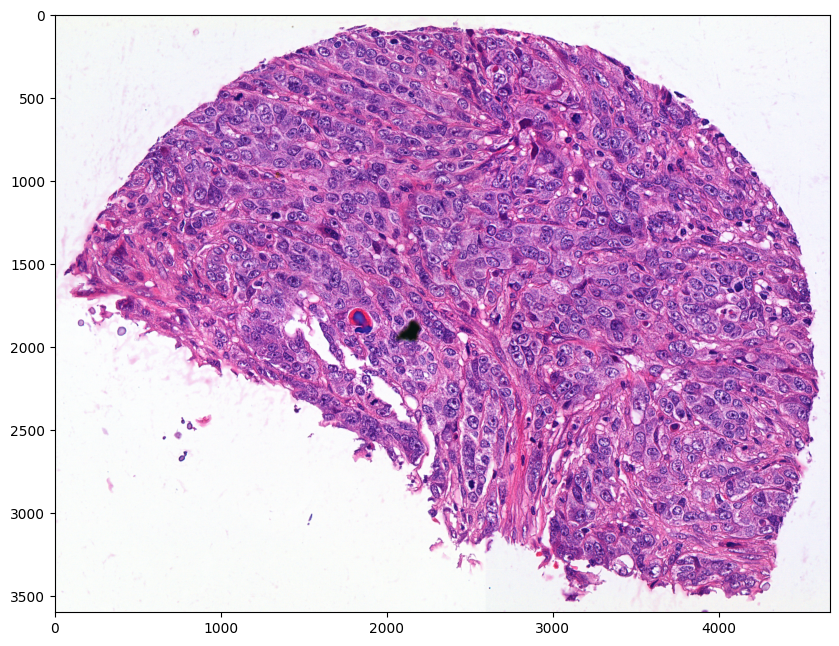

In [ ]:
show_core(slide, slide_df, core_name='P383_2')